### pre-processing

This notebook is concerned with running quality assurance checks on incoming  
data and providing the user with options to rectify data quality issues.

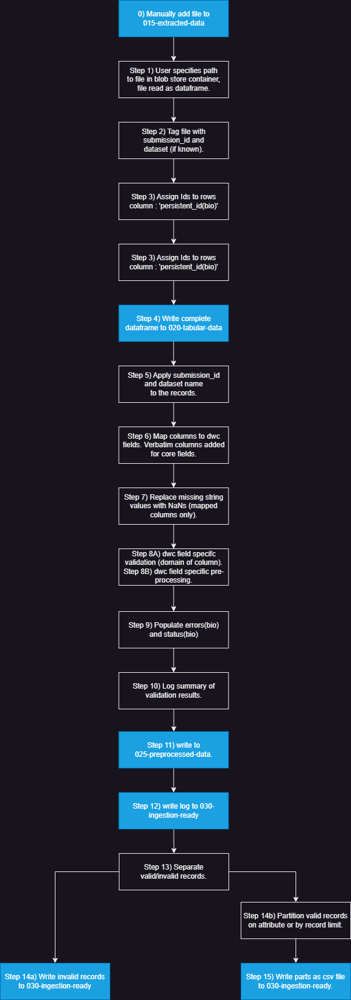

In [97]:
import sys
from pathlib import Path
sys.path.insert(0,str(Path.cwd().parent))
from package import *
from datetime import datetime
from package.DandjooId import DandjooId
from shapely.geometry import MultiPolygon
import geopandas as gpd
import matplotlib.pyplot as plt
from azure.storage.blob import BlobServiceClient, BlobClient, ContainerClient
import socket
from dateutil import parser
from datetime import datetime
from pyproj import Proj, transform
pd.set_option('display.max_rows', None, 'display.max_columns', None, 'display.width', None, 'display.max_colwidth',None)

QUALITY ASSURANCE CHECK ON THE FUNGI FOREST DATA

Step 1) User specifies path to file in blob store container, file read as dataframe.


In [98]:
# define containers: 010-recieved, 015-recieved, record deltas
creds: pd.DataFrame = pd.read_csv('credential.csv',dtype=str, index_col='item')
cred: str = creds.loc['cred','value']

a10_recieved: str = creds.loc['10_recieved','value']
a15_extracted: str = creds.loc['15_extracted','value']
a20_tabular: str = creds.loc['20_tabular','value']
a25_preprocessed: str = creds.loc['25_preprocessed','value']
a30_ingestion: str = creds.loc['30_ingestion','value']

a10_recieved: ContainerClient = ContainerClient.from_container_url(a10_recieved, cred)
a15_extracted: ContainerClient = ContainerClient.from_container_url(a15_extracted, cred)
a20_tabular: ContainerClient = ContainerClient.from_container_url(a20_tabular, cred)
a25_preprocessed: ContainerClient = ContainerClient.from_container_url(a25_preprocessed, cred)
a30_ingestion: ContainerClient = ContainerClient.from_container_url(a30_ingestion, cred)

# Define file paramaters - the path of the file in the blobstore.
infile: Path = Path('AquaticProjects/ForestCheck Data/Fungi/Fungi Master File.xlsx')
parent: Path = infile.parent
filename: str = infile.name.removesuffix(infile.suffix).lower().replace('.','')
filename = '_'.join(filename.split())
targetp: Path = parent / f'{filename}.csv'
partdir: Path = parent / filename
logpath: Path = partdir / f'{filename}_log.csv'
invpath: Path = partdir / f'{filename}_invalid.csv'

eventlog: pd.DataFrame = pd.DataFrame(columns=['event_id','datetime','user','description'])
message, af = read_df(a15_extracted, infile)
af.head()



,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,DATE,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37
0,TOTAL RECORD NO,SURVEY RECORD NO,RECORD NO,YEAR,SEASON,DAY,MONTH,YEAR,OBSERVERS,SPECIES #,ORDER,FAMILY,TAXON,LIFE MODE,SUBSTRATE,SURVEY,# FRUITING BODIES,TRANSECT,SECTION,PLOT NO,GRID PREFIX,LOCATION,TREATEMENT,FIRE TREATMENT,GDA94 EASTING Central Peg W2.3,GDA94 NORTHING Central Peg W2.3,SECTION Easting,SECTION Northing,Notes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,16898,SV1-1,1,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,11,Agaricales,Strophariaceae,Galerina sp. hanging gills and conic (R.M. Robinson & R.H. Smith FC11),Saprotrophic,Litter/Soil,1,5,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,16899,SV1-2,2,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,53,Agaricales,Inocybaceae,Inocybe sp. tan skirt (R.M. Robinson & R.H. Smith FC60),Mycorrhizal,Soil,1,4,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,16900,SV1-3,3,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,50,Agaricales,Mycenaceae,Mycena mijoi Grgur.,Saprotrophic,Litter,1,54,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,16901,SV1-4,4,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,51,Agaricales,Mycenaceae,Mycena yirukensis Grgur.,Saprotrophic,Litter/Twigs,1,7,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Logged error while reading file

In [99]:
logevent(description=f'errors when reading file "{str(infile)}" : {message}',
         user=socket.gethostname(),
         eventlog=eventlog)

,event_id,datetime,user,description
0,2024JLOY2e2bc755,2024-09-11T14:24:53.928730,Charles,"errors when reading file ""AquaticProjects/ForestCheck Data/Fungi/Fungi Master File.xlsx"" : N/A"


Set the first row (row's numbering 0) in 'af' DataFrame,  as the new header

In [100]:
aff: pd.DataFrame = af.copy(deep=True)  # Make a copy of the original DataFrame

aff.columns = aff.iloc[0]  # Set the first row's as the header

# Drop the first row, since it's now the header. I.e, since the row 0's from the af dataframe has become the new column, use the next row (ie row 1 in af) as the first row in aff dataframe
aff = aff[1:]

# Reset the index to ensure a clean DataFrame
aff.reset_index(drop=True, inplace=True)

# Display the final DataFrame
aff.head()

# Optional, get the new column names
#aff.columns




,TOTAL RECORD NO,SURVEY RECORD NO,RECORD NO,YEAR,SEASON,DAY,MONTH,YEAR,OBSERVERS,SPECIES #,ORDER,FAMILY,TAXON,LIFE MODE,SUBSTRATE,SURVEY,# FRUITING BODIES,TRANSECT,SECTION,PLOT NO,GRID PREFIX,LOCATION,TREATEMENT,FIRE TREATMENT,GDA94 EASTING Central Peg W2.3,GDA94 NORTHING Central Peg W2.3,SECTION Easting,SECTION Northing,Notes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,16898,SV1-1,1,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,11,Agaricales,Strophariaceae,Galerina sp. hanging gills and conic (R.M. Robinson & R.H. Smith FC11),Saprotrophic,Litter/Soil,1,5,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,16899,SV1-2,2,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,53,Agaricales,Inocybaceae,Inocybe sp. tan skirt (R.M. Robinson & R.H. Smith FC60),Mycorrhizal,Soil,1,4,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,16900,SV1-3,3,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,50,Agaricales,Mycenaceae,Mycena mijoi Grgur.,Saprotrophic,Litter,1,54,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,16901,SV1-4,4,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,51,Agaricales,Mycenaceae,Mycena yirukensis Grgur.,Saprotrophic,Litter/Twigs,1,7,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,16902,SV1-5,5,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,182,Agaricales,Mycenaceae,Mycena spp. (unidentified),Saprotrophic,Wood,1,1,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Renaming some complex column names into a simple name

In [101]:
def rename_columns(df, columns_dict):
    """
    Rename columns in a Dataframe.

    Parameters:
    df(pd.DataFrame): The DataFrame whose columns need to be renamed.
    columns_dict(dict): A dictionary where keys are old column names and values are new column names.

    Returns:
    pd.DataFrame: DataFrame with renamed columns.
    """
    df.rename(columns=columns_dict, inplace=True)
    return df

# Renaming columns
new_columns = {'GDA94 EASTING Central Peg W2.3': 'GDA94 EASTING Central', 'GDA94 NORTHING Central Peg W2.3': 'GDA94 NORTHING Central'}
aff = rename_columns(aff, new_columns)
aff.head()

,TOTAL RECORD NO,SURVEY RECORD NO,RECORD NO,YEAR,SEASON,DAY,MONTH,YEAR,OBSERVERS,SPECIES #,ORDER,FAMILY,TAXON,LIFE MODE,SUBSTRATE,SURVEY,# FRUITING BODIES,TRANSECT,SECTION,PLOT NO,GRID PREFIX,LOCATION,TREATEMENT,FIRE TREATMENT,GDA94 EASTING Central,GDA94 NORTHING Central,SECTION Easting,SECTION Northing,Notes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,16898,SV1-1,1,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,11,Agaricales,Strophariaceae,Galerina sp. hanging gills and conic (R.M. Robinson & R.H. Smith FC11),Saprotrophic,Litter/Soil,1,5,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,16899,SV1-2,2,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,53,Agaricales,Inocybaceae,Inocybe sp. tan skirt (R.M. Robinson & R.H. Smith FC60),Mycorrhizal,Soil,1,4,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,16900,SV1-3,3,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,50,Agaricales,Mycenaceae,Mycena mijoi Grgur.,Saprotrophic,Litter,1,54,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,16901,SV1-4,4,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,51,Agaricales,Mycenaceae,Mycena yirukensis Grgur.,Saprotrophic,Litter/Twigs,1,7,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,16902,SV1-5,5,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,182,Agaricales,Mycenaceae,Mycena spp. (unidentified),Saprotrophic,Wood,1,1,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Convert the location data ('GDA94 EASTING Central' and 'GDA94 NORTHING Central') to Longitude and Latitude

In [102]:
# Define projections using EPSG codes
gda94 = Proj('epsg:28350')  # GDA94 
wgs84 = Proj('epsg:4326')   # WGS84

# Function to convert coordinates
def convert_to_latlon(easting, northing):
    lat, lon = transform(gda94, wgs84, easting, northing)
    return lat, lon

# Apply conversion by calling the function
aff['Latitude'], aff['Longitude'] = zip(*aff.apply(lambda row: convert_to_latlon(row['GDA94 EASTING Central'], row['GDA94 NORTHING Central']), axis=1))

aff.head()

/tmp/ipykernel_36795/1575176851.py:7: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lat, lon = transform(gda94, wgs84, easting, northing)


,TOTAL RECORD NO,SURVEY RECORD NO,RECORD NO,YEAR,SEASON,DAY,MONTH,YEAR,OBSERVERS,SPECIES #,ORDER,FAMILY,TAXON,LIFE MODE,SUBSTRATE,SURVEY,# FRUITING BODIES,TRANSECT,SECTION,PLOT NO,GRID PREFIX,LOCATION,TREATEMENT,FIRE TREATMENT,GDA94 EASTING Central,GDA94 NORTHING Central,SECTION Easting,SECTION Northing,Notes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Latitude,Longitude
0,16898,SV1-1,1,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,11,Agaricales,Strophariaceae,Galerina sp. hanging gills and conic (R.M. Robinson & R.H. Smith FC11),Saprotrophic,Litter/Soil,1,5,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-34.076078,116.327252
1,16899,SV1-2,2,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,53,Agaricales,Inocybaceae,Inocybe sp. tan skirt (R.M. Robinson & R.H. Smith FC60),Mycorrhizal,Soil,1,4,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-34.076078,116.327252
2,16900,SV1-3,3,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,50,Agaricales,Mycenaceae,Mycena mijoi Grgur.,Saprotrophic,Litter,1,54,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-34.076078,116.327252
3,16901,SV1-4,4,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,51,Agaricales,Mycenaceae,Mycena yirukensis Grgur.,Saprotrophic,Litter/Twigs,1,7,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-34.076078,116.327252
4,16902,SV1-5,5,2002,WINTER,6,6,2002,Richard ROBINSON and Bob SMITH,182,Agaricales,Mycenaceae,Mycena spp. (unidentified),Saprotrophic,Wood,1,1,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-34.076078,116.327252


Concartenate the 'YEAR', 'MONTH' and 'DAY' column in 'aff' DataFrame to a new column called 'DATE'

In [103]:
# Create a new variable for the aff dataframe above
af1: pd.DataFrame = aff.copy(deep=True)

# Ensure column names are correct
af1.columns = af1.columns.str.strip()

# Drop any duplicate column (ie select only columns that are not duplicate)
af1 = af1.loc[:, ~af1.columns.duplicated()]

# Create 'DATE' column, and ensure that invalid 'DATES' are converted to NAN (Using the function, errors='coerce')
af1['DATE'] = pd.to_datetime(af1[['YEAR','MONTH','DAY']], errors='coerce')

# Drop rows where 'DATE' is NAN or Not a time
#af1 = af1.dropna(subset=['DATE'])

af1.head()



,TOTAL RECORD NO,SURVEY RECORD NO,RECORD NO,YEAR,SEASON,DAY,MONTH,OBSERVERS,SPECIES #,ORDER,FAMILY,TAXON,LIFE MODE,SUBSTRATE,SURVEY,# FRUITING BODIES,TRANSECT,SECTION,PLOT NO,GRID PREFIX,LOCATION,TREATEMENT,FIRE TREATMENT,GDA94 EASTING Central,GDA94 NORTHING Central,SECTION Easting,SECTION Northing,Notes,NaN,Latitude,Longitude,DATE
0,16898,SV1-1,1,2002,WINTER,6,6,Richard ROBINSON and Bob SMITH,11,Agaricales,Strophariaceae,Galerina sp. hanging gills and conic (R.M. Robinson & R.H. Smith FC11),Saprotrophic,Litter/Soil,1,5,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,-34.076078,116.327252,2002-06-06
1,16899,SV1-2,2,2002,WINTER,6,6,Richard ROBINSON and Bob SMITH,53,Agaricales,Inocybaceae,Inocybe sp. tan skirt (R.M. Robinson & R.H. Smith FC60),Mycorrhizal,Soil,1,4,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,-34.076078,116.327252,2002-06-06
2,16900,SV1-3,3,2002,WINTER,6,6,Richard ROBINSON and Bob SMITH,50,Agaricales,Mycenaceae,Mycena mijoi Grgur.,Saprotrophic,Litter,1,54,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,-34.076078,116.327252,2002-06-06
3,16901,SV1-4,4,2002,WINTER,6,6,Richard ROBINSON and Bob SMITH,51,Agaricales,Mycenaceae,Mycena yirukensis Grgur.,Saprotrophic,Litter/Twigs,1,7,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,-34.076078,116.327252,2002-06-06
4,16902,SV1-5,5,2002,WINTER,6,6,Richard ROBINSON and Bob SMITH,182,Agaricales,Mycenaceae,Mycena spp. (unidentified),Saprotrophic,Wood,1,1,1,0-50,FC01,MKG1,KINGSTON,EXTERNAL CONTROL,NaN,437928.05,6229204.38002,437835.82550000004,6229212.48752,NaN,NaN,-34.076078,116.327252,2002-06-06


Step 2) Tag file with submission_id and dataset (if known).

In [104]:
exist: dict[str,str] = gettags(a15_extracted, infile)
tags: dict[str,str] = {'submission_id': str(DandjooId()), 'dataset': 'Fungi Master File data'}
tagfile(a15_extracted, infile, tags)

logevent(description=f'"{infile}" in container "015-extracted-data" tagged with: {tags}',
         user=socket.gethostname(),
         eventlog=eventlog)

,event_id,datetime,user,description
0,2024JLOY2e2bc755,2024-09-11T14:24:53.928730,Charles,"errors when reading file ""AquaticProjects/ForestCheck Data/Fungi/Fungi Master File.xlsx"" : N/A"
1,2024JLOhJ7fe914a,2024-09-11T14:33:09.523958,Charles,"""AquaticProjects/ForestCheck Data/Fungi/Fungi Master File.xlsx"" in container ""015-extracted-data"" tagged with: {'submission_id': '2024JLOhJ63a37dd', 'dataset': 'Fungi Master File data'}"


Step 3) Assign Ids to rows column : 'persistent_id(bio)'  
Step 4) Write complete dataframe to 020-tabular-data

In [105]:
uid_column: str = 'persistent_id(bio)'
bf: pd.DataFrame = af1.copy(deep=True)
uids: pd.Series = pd.Series([str(DandjooId()) for i in range(len(bf))])

if not uids.is_unique:
    raise Exception('uids not unique.')
bf[uid_column] = uids

logevent(description=f'{len(bf)} uids added to column "{uid_column}".',
         user=socket.gethostname(),
         eventlog=eventlog)

ordered: list[str] = [uid_column] + [x for x in bf.columns if x != uid_column]
bf = bf.loc[:, ordered]
write_to_blob(bf, a20_tabular, targetp, index=False, timeout=12000)

# assign submission id to file in twelve extracted.
tagfile(a20_tabular, targetp, tags)
#bf.head()

{'submission_id': '2024JLOhJ63a37dd', 'dataset': 'Fungi Master File data'}

Step 5) Apply submission_id and dataset name to the records.

In [106]:
bbf: pd.DataFrame = bf.copy(deep=True)
bbf['dwc:datasetName'] = tags['dataset']
bbf['submission_id(bio)'] = tags['submission_id']
bbf.set_index(keys=['dwc:datasetName','submission_id(bio)','persistent_id(bio)'], inplace=True)
#bbf.head()

logevent(description=f'columns "dwc:datasetName" and "submission_id(bio)" populated.',
         user=socket.gethostname(),
         eventlog=eventlog)

,event_id,datetime,user,description
0,2024JLOY2e2bc755,2024-09-11T14:24:53.928730,Charles,"errors when reading file ""AquaticProjects/ForestCheck Data/Fungi/Fungi Master File.xlsx"" : N/A"
1,2024JLOhJ7fe914a,2024-09-11T14:33:09.523958,Charles,"""AquaticProjects/ForestCheck Data/Fungi/Fungi Master File.xlsx"" in container ""015-extracted-data"" tagged with: {'submission_id': '2024JLOhJ63a37dd', 'dataset': 'Fungi Master File data'}"
2,2024JLOhW5c6e155,2024-09-11T14:33:22.378611,Charles,"23000 uids added to column ""persistent_id(bio)""."
3,2024JLOiT31121b1,2024-09-11T14:34:19.201013,Charles,"columns ""dwc:datasetName"" and ""submission_id(bio)"" populated."


Step 6) Map columns to dwc fields. Map columns to Verbatim fields.

In [107]:
cf: pd.DataFrame = bbf.copy(deep=True)
dwc : dict[str, str] = {
    'TAXON': 'dwc:taxon',
    'DATE': 'dwc:eventDate',
    'Latitude': 'dwc:decimalLatitude',
    'Longitude': 'dwc:decimalLongitude'
    }
verbatim: dict[str, str] = {
    'TAXON': 'dwc:verbatimIdentification',
    'DATE': 'dwc:verbatimEventDate',
    'Latitude': 'dwc:verbatimLatitude',
    'Longitude': 'dwc:verbatimLongitude'
    }

for key, value in verbatim.items():
    cf[value] = cf[key].copy(deep=True)
cf.rename(columns=dwc, inplace=True)

entry1:str = f'columns remapped: {dwc}'
entry2:str = f'verbatim fields added: {verbatim}'
logevent(description=entry1, user=socket.gethostname(), eventlog=eventlog)
logevent(description=entry2, user=socket.gethostname(), eventlog=eventlog)

# order columns alphabetically.
dwc: list[str] = sorted(dwc.values())
verbatim: list[str] = sorted(verbatim.values())
unmapped: list[str] = [x for x in cf.columns if not (x in dwc + verbatim)]

cf = cf.loc[:, dwc + verbatim + unmapped]
cf.sort_values(by='dwc:taxon', ascending=True, inplace=True)
cf.head()



0                                                             dwc:decimalLatitude  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                        
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc             -32.115049   
                                          2024JLOhW54cafd2             -33.145531   
                                          2024JLOhW556c411             -32.178719   
                                          2024JLOhW4e940cc             -33.131460   
                                          2024JLOhW538c30d             -34.092532   

0                                                             dwc:decimalLongitude  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                         
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc              116.235136   
                                          2024JLOhW54cafd2              116.237138   
                                          2024JLOhW556c411              116.254732   
                                          2024JLOhW4e940cc              116.428950   
                                          2024JLOhW538c30d              116.030225   

0                                                            dwc:eventDate  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                 
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc      2010-06-15   
                                          2024JLOhW54cafd2      2009-06-25   
                                          2024JLOhW556c411      2010-06-15   
                                          2024JLOhW4e940cc      2005-06-23   
                                          2024JLOhW538c30d      2008-05-27   

0                                                                               dwc:taxon  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                                
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc     Amanita spp.  unidentified   
                                          2024JLOhW54cafd2     Amanita spp.  unidentified   
                                          2024JLOhW556c411     Amanita spp.  unidentified   
                                          2024JLOhW4e940cc     Amanita spp.  unidentified   
                                          2024JLOhW538c30d     Amanita spp.  unidentified   

0                                                            dwc:verbatimEventDate  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                         
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc              2010-06-15   
                                          2024JLOhW54cafd2              2009-06-25   
                                          2024JLOhW556c411              2010-06-15   
                                          2024JLOhW4e940cc              2005-06-23   
                                          2024JLOhW538c30d              2008-05-27   

0                                                              dwc:verbatimIdentification  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                                
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc     Amanita spp.  unidentified   
                                          2024JLOhW54cafd2     Amanita spp.  unidentified   
                                          2024JLOhW556c411     Amanita spp.  unidentified   
                                          2024JLOhW4e940cc     Amanita spp.  unidentified   
                                          2024JLOhW538c30d     Amanita spp.  unidentified   

0                                                             dwc:verbatimLatitude  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                         
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc              -32.115049   
                                          2024JLOhW54cafd2              -33.145531   
   

Step 7) Replace missing string values with NaNs (mapped columns only).

In [108]:
df: pd.DataFrame = cf.copy(deep=True)

# replace missing values with NaN
missing_values: list[str] = ['n/a', 'null', '<null>', 'nan', 'none']
missing_count: int = 0

for column in dwc:
    for missing_value in missing_values:
        m: pd.Series = df[column].apply(lambda x: x.lower() if isinstance(x, str) else x ) == missing_value
        df.loc[m, column] = float('nan')
        missing_count += len(df.loc[m])

logevent(description=f'number of missing string values replaced: {missing_count}.',
         user=socket.gethostname(),
         eventlog=eventlog)
df.head()

0                                                             dwc:decimalLatitude  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                        
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc             -32.115049   
                                          2024JLOhW54cafd2             -33.145531   
                                          2024JLOhW556c411             -32.178719   
                                          2024JLOhW4e940cc             -33.131460   
                                          2024JLOhW538c30d             -34.092532   

0                                                             dwc:decimalLongitude  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                         
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc              116.235136   
                                          2024JLOhW54cafd2              116.237138   
                                          2024JLOhW556c411              116.254732   
                                          2024JLOhW4e940cc              116.428950   
                                          2024JLOhW538c30d              116.030225   

0                                                            dwc:eventDate  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                 
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc      2010-06-15   
                                          2024JLOhW54cafd2      2009-06-25   
                                          2024JLOhW556c411      2010-06-15   
                                          2024JLOhW4e940cc      2005-06-23   
                                          2024JLOhW538c30d      2008-05-27   

0                                                                               dwc:taxon  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                                
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc     Amanita spp.  unidentified   
                                          2024JLOhW54cafd2     Amanita spp.  unidentified   
                                          2024JLOhW556c411     Amanita spp.  unidentified   
                                          2024JLOhW4e940cc     Amanita spp.  unidentified   
                                          2024JLOhW538c30d     Amanita spp.  unidentified   

0                                                            dwc:verbatimEventDate  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                         
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc              2010-06-15   
                                          2024JLOhW54cafd2              2009-06-25   
                                          2024JLOhW556c411              2010-06-15   
                                          2024JLOhW4e940cc              2005-06-23   
                                          2024JLOhW538c30d              2008-05-27   

0                                                              dwc:verbatimIdentification  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                                
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc     Amanita spp.  unidentified   
                                          2024JLOhW54cafd2     Amanita spp.  unidentified   
                                          2024JLOhW556c411     Amanita spp.  unidentified   
                                          2024JLOhW4e940cc     Amanita spp.  unidentified   
                                          2024JLOhW538c30d     Amanita spp.  unidentified   

0                                                             dwc:verbatimLatitude  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                         
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc              -32.115049   
                                          2024JLOhW54cafd2              -33.145531   
   

Step 8A) dwc field specifc validation (domain of column).  
Step 8B) dwc field specific pre-processing.
 
Note:
- validation steps are separated so that cause of invalid datapoints is easily identified.  
- user must specify whether day comes before month.

In [94]:
# validate datatypes.
#ef: pd.DataFrame = df.copy(deep=True)
#lat_type_valid = ef['dwc:decimalLatitude'].apply(lambda x: validate_float(x))
#lon_type_valid = ef['dwc:decimalLongitude'].apply(lambda x: validate_float(x))
#date_type_valid = ef['dwc:eventDate'].apply(lambda x: validate_datetime(x))
#sci_type_valid = ef['dwc:taxon'].notna()
#umlat: pd.Series = ef.apply(lambda row: row.astype(str).str.contains('[üöäÄÖÜ]').any(), axis=1)


In [15]:
# validate datatypes with some conditions
#ef: pd.DataFrame = df.copy(deep=True)
#lat_type_valid = ef['dwc:decimalLatitude'].apply(lambda x: validate_float(x) and -90 <= float(x) <= 90)
#lon_type_valid = ef['dwc:decimalLongitude'].apply(lambda x: validate_float(x) and -180 <= float(x) <= 180)
#date_type_valid = ef['dwc:eventDate'].apply(lambda x: validate_datetime(x))
#sci_type_valid = ef['dwc:taxon'].notna()
#umlat: pd.Series = ef.apply(lambda row: any(isinstance(row[col], str) and bool(re.search('[üöäÄÖÜ]', row[col])) for col in ef.columns), axis=1)



Validate the datatypes 

In [109]:
# Deep copy to ef dataframe
ef: pd.DataFrame = df.copy(deep=True)

# Latitude and Longitude Validation

# Ensure the lat and lon columns all have numeric data, and convert to numerical, any string data in these columns
ef['dwc:decimalLatitude'] = pd.to_numeric(ef['dwc:decimalLatitude'], errors='coerce')
ef['dwc:decimalLongitude'] = pd.to_numeric(ef['dwc:decimalLongitude'], errors='coerce')

# Validate lat and long
lat_type_valid = (ef['dwc:decimalLatitude'] >= -90) & (ef['dwc:decimalLatitude'] <= 90)
lon_type_valid = (ef['dwc:decimalLongitude'] >= -180) & (ef['dwc:decimalLongitude'] <= 180)

# Print results of lat/lon validation
print("Latitude Validation:\n", lat_type_valid)
print("Longitude Validation:\n", lon_type_valid)



Latitude Validation:
 dwc:datasetName         submission_id(bio)  persistent_id(bio)
Fungi Master File data  2024JLOhJ63a37dd    2024JLOhW55754fc      True
                                            2024JLOhW54cafd2      True
                                            2024JLOhW556c411      True
                                            2024JLOhW4e940cc      True
                                            2024JLOhW538c30d      True
                                            2024JLOhW5a8a8bd      True
                                            2024JLOhW54e7c43      True
                                            2024JLOhW56fc82d      True
                                            2024JLOhW52d2305      True
                                            2024JLOhW53ebf32      True
                                            2024JLOhW589fe54      True
                                            2024JLOhW560090a      True
                                            2024JLOhW56d78f6   

In [110]:
# Date Validation

# Write a function to validate date
def validate_datetime(date_str):
    if pd.isna(date_str):
        return pd.NA  # Returns NaN values in dates if any
    try:
        # Try to parse the date with dateutil.parser
        parser.parse(date_str, dayfirst=False)  # Means the date shouldn't start with day
        return True
    except (ValueError, TypeError):
        return False
    

# Ensure dates are treated as strings
ef['dwc:eventDate'] = ef['dwc:eventDate'].astype(str)

# Apply the function to the 'dwc:eventDate' column for the validation check
date_type_valid = ef['dwc:eventDate'].apply(lambda x: validate_datetime(x))

# Print validation results
print("Date Validation Results:\n", date_type_valid)




Date Validation Results:
 dwc:datasetName         submission_id(bio)  persistent_id(bio)
Fungi Master File data  2024JLOhJ63a37dd    2024JLOhW55754fc      True
                                            2024JLOhW54cafd2      True
                                            2024JLOhW556c411      True
                                            2024JLOhW4e940cc      True
                                            2024JLOhW538c30d      True
                                            2024JLOhW5a8a8bd      True
                                            2024JLOhW54e7c43      True
                                            2024JLOhW56fc82d      True
                                            2024JLOhW52d2305      True
                                            2024JLOhW53ebf32      True
                                            2024JLOhW589fe54      True
                                            2024JLOhW560090a      True
                                            2024JLOhW56d78f

In [111]:
# Scientific name Validation

# Validate scientific name
sci_type_valid = ef['dwc:taxon'].notna()

# Print results of date validation
print("Scientific Name  Validation:\n", sci_type_valid)


Scientific Name  Validation:
 dwc:datasetName         submission_id(bio)  persistent_id(bio)
Fungi Master File data  2024JLOhJ63a37dd    2024JLOhW55754fc       True
                                            2024JLOhW54cafd2       True
                                            2024JLOhW556c411       True
                                            2024JLOhW4e940cc       True
                                            2024JLOhW538c30d       True
                                            2024JLOhW5a8a8bd       True
                                            2024JLOhW54e7c43       True
                                            2024JLOhW56fc82d       True
                                            2024JLOhW52d2305       True
                                            2024JLOhW53ebf32       True
                                            2024JLOhW589fe54       True
                                            2024JLOhW560090a       True
                                           

In [112]:
# Location Domain Validation (Check if coordinates fall within valid extents and border)

# Set extents and border
EEZ:Path = Path.cwd().parent / "files/exclusive_economic_zone_truncated.shp"
extents: gpd.GeoDataFrame = gpd.read_file(EEZ)
border: MultiPolygon = extents.dissolve()['geometry'].to_list()[0]
#print(border)

# Validate location
loc_domain = ef.apply(lambda x: location_domain(x['dwc:decimalLongitude'], x['dwc:decimalLatitude'], border, basic=False), axis=1)

# Print results of location domain validation
print("Location Domain Validation:\n", loc_domain)

Location Domain Validation:
 dwc:datasetName         submission_id(bio)  persistent_id(bio)
Fungi Master File data  2024JLOhJ63a37dd    2024JLOhW55754fc      True
                                            2024JLOhW54cafd2      True
                                            2024JLOhW556c411      True
                                            2024JLOhW4e940cc      True
                                            2024JLOhW538c30d      True
                                            2024JLOhW5a8a8bd      True
                                            2024JLOhW54e7c43      True
                                            2024JLOhW56fc82d      True
                                            2024JLOhW52d2305      True
                                            2024JLOhW53ebf32      True
                                            2024JLOhW589fe54      True
                                            2024JLOhW560090a      True
                                            2024JLOhW56d

In [113]:
# Check Date Domain Validation

# Write a function to validate date_domain
def datetime_domain(date_str, min_date):
    if pd.isna(date_str):
        return pd.NA  # Return NA values in the date if any
    try:
        # Parse the date using dateutil.parser
        parsed_date = parser.parse(date_str)
        # Check if parsed date is after the minimum date
        return parsed_date >= min_date
    except (ValueError, TypeError):
        return False

# Set the minimum date
MIN_DATE = datetime(1755, 1, 1)

# Validate the date domain
date_domain = ef['dwc:eventDate'].apply(lambda x: datetime_domain(x, MIN_DATE))

# Print results of date domain validation
print("Date Domain Validation:\n", date_domain)    

Date Domain Validation:
 dwc:datasetName         submission_id(bio)  persistent_id(bio)
Fungi Master File data  2024JLOhJ63a37dd    2024JLOhW55754fc      True
                                            2024JLOhW54cafd2      True
                                            2024JLOhW556c411      True
                                            2024JLOhW4e940cc      True
                                            2024JLOhW538c30d      True
                                            2024JLOhW5a8a8bd      True
                                            2024JLOhW54e7c43      True
                                            2024JLOhW56fc82d      True
                                            2024JLOhW52d2305      True
                                            2024JLOhW53ebf32      True
                                            2024JLOhW589fe54      True
                                            2024JLOhW560090a      True
                                            2024JLOhW56d78f6

In [114]:
# Umlaut Validation (Check if any columns contain umlaut characters i.e special characters)

# Validate umlaut
umlat = ef.apply(lambda row: any(isinstance(row[col], str) and bool(re.search('[üöäÄÖÜ]', row[col])) for col in ef.columns), axis=1)

# Print results of umlaut validation
print("Umlaut Validation:\n", umlat)

Umlaut Validation:
 dwc:datasetName         submission_id(bio)  persistent_id(bio)
Fungi Master File data  2024JLOhJ63a37dd    2024JLOhW55754fc      False
                                            2024JLOhW54cafd2      False
                                            2024JLOhW556c411      False
                                            2024JLOhW4e940cc      False
                                            2024JLOhW538c30d      False
                                            2024JLOhW5a8a8bd      False
                                            2024JLOhW54e7c43      False
                                            2024JLOhW56fc82d      False
                                            2024JLOhW52d2305      False
                                            2024JLOhW53ebf32      False
                                            2024JLOhW589fe54      False
                                            2024JLOhW560090a      False
                                            2024JLOhW

In [16]:
# parse valid to data type of the column. This is converting the valid location data to decimal
#ef.loc[lon_type_valid,'dwc:decimalLongitude'] = ef.loc[lon_type_valid,'dwc:decimalLongitude'].astype(float)
#ef.loc[lat_type_valid,'dwc:decimalLatitude'] = ef.loc[lat_type_valid,'dwc:decimalLatitude'].astype(float)


In [17]:
# IMPORTANT - user to specify whether day before month.
#dayfirst: bool = False # Means don't specify day first when formating the date
#ef.loc[date_type_valid,'dwc:eventDate'] = ef.loc[date_type_valid,'dwc:eventDate'].apply(lambda x: format_datetime(x, dayfirst=dayfirst, return_datetime=True))
#ef.head()



In [18]:
# validate if data points fall within accepted domain.
# validate coordinates.
# extents: gpd.GeoDataFrame = gpd.read_file("/home/hsp/extents/extents_proposed.shp")
# IMPORTANT
#MIN_DATE: datetime = datetime(1755,1,1)
#EEZ:Path = Path.cwd().parent / "files/exclusive_economic_zone_truncated.shp"
#extents: gpd.GeoDataFrame = gpd.read_file(EEZ)
#border: MultiPolygon = extents.dissolve()['geometry'].to_list()[0]
#print(border)

# Validate coordinates
#loc_domain: pd.Series = ef.apply(lambda x: location_domain(x['dwc:decimalLongitude'],x['dwc:decimalLatitude'], border, basic=False),axis=1)

# Check the validation result for the loc_domain 
#loc_domain.head()


# validate date time.
#date_domain: pd.Series = ef['dwc:eventDate'].apply(lambda x: datetime_domain(x, MIN_DATE))


# Check the validation result of the date_domain
#date_domain.head()

Validation Result:

. The date_domain returned true, which means all the dates falls after January 1, 1975 (according to the the set 'MIN_DATE' condition). So the date_domain passed the validation

. The loc_domain returned true, which means the the location data falls inside the defined geographic area ('border'). So location domain passed the validation

. The umlat returned false and true, which means some of columns data contains special umlaut character(üöäÄÖÜ) while others don't. So validation is passed for some. 

. The sci_type_valid returned both true and false, which means some of the scientific names contains a 'nan' value. So validation is passed for some and failed for others

. The lat_type_valid returned true, which means all latitude values falls within '-90 to 90'. So validation is passed for this

. The lon_type_valid returned true, which means all longitude values falls within '-180 to 180'. So validation is passed for this

. The date_type_valid returned true, which means no date starts from 'day'. So validation is passed for this

In [ ]:
# apply field specific formatting.
# capitalise first name in sci name.
# ef['dwc:scientificName'] = ef['dwc:scientificName'].apply(lambda x: capitalise_first(x))
# parse datetimes back to string.
#ef.loc[date_type_valid,'dwc:eventDate'] = ef.loc[date_type_valid,'dwc:eventDate'].apply(lambda x: format_datetime(x, return_datetime=False))
#ef.head()

Visualize coordinates for user's benefit.

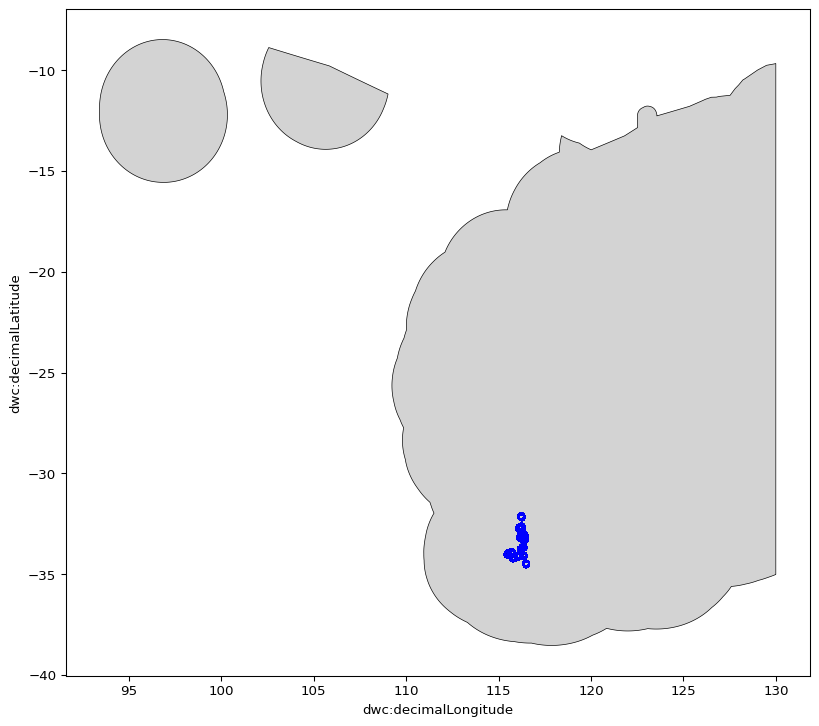

In [117]:
# visualize the coordinates.
basemap: gpd.GeoDataFrame = gpd.read_file(EEZ)
f, ax = plt.subplots(1, figsize=(10,10), dpi=96)
basemap.plot(ax=ax, color='lightgray')
extents.plot(ax=ax,cmap=None, alpha=1, edgecolor='black', color='none', linewidths=0.5)
ef.loc[lat_type_valid & lon_type_valid & loc_domain].plot.scatter(ax=ax, x='dwc:decimalLongitude', y='dwc:decimalLatitude', edgecolor='blue', color='none')
#ef.loc[lat_type_valid & lon_type_valid  & ~loc_domain].plot.scatter(ax=ax, x='dwc:decimalLongitude',y='dwc:decimalLatitude', edgecolor='red', color='none')
plt.show()

Step 9) Populate errors(bio) and status(bio):
- status(bio) is either 'valid'/'invalid' 
- errors(bio) gives reason(s) for invalidation.

In [120]:
gf: pd.DataFrame = ef.copy(deep=True)
gf['errors(bio)'] = [[] for x in range(len(gf))]
gf['status(bio)'] = float('nan')

invalid_dtype: dict[str, pd.Series] = {
    'dwc:decimalLongitude': ~lon_type_valid, # not in lon_type_valid
    'dwc:decimalLatitude': ~lat_type_valid,
    'dwc:eventDate': ~date_type_valid,
    'dwc:taxon': ~sci_type_valid}

for column, series in invalid_dtype.items():    
    gf.loc[series, 'status(bio)'] = 'INVALID'
    message: str = f'invalid dtype in column: {column}'
    gf.loc[series, 'errors(bio)'].apply(lambda x: x.append(message))

invalid_domain: dict[str, pd.Series] = {
    'location': ~loc_domain & lon_type_valid & lat_type_valid,
    'datetime': ~date_domain & date_type_valid
    }

for domain, series in invalid_domain.items():
    message: str = f'observation outside valid {domain} domain'
    gf.loc[series, 'status(bio)'] = 'INVALID'
    gf.loc[series, 'errors(bio)'].apply(lambda x: x.append(message))

message: str = f'Record contains character with umlat.'
gf.loc[umlat, 'status(bio)'] = 'INVALID'
gf.loc[umlat, 'errors(bio)'].apply(lambda x: x.append(message))

# Set status to valid on  empty 'status(bio)' column data
m: pd.Series = gf['status(bio)'].isna()
gf.loc[m, 'status(bio)'] = 'VALID'
meta: list[str] = ['status(bio)','errors(bio)']

gf = gf.loc[:, meta+dwc+verbatim+unmapped]
gf.head()

0                                                            status(bio)  \
dwc:datasetName        submission_id(bio) persistent_id(bio)               
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc         VALID   
                                          2024JLOhW54cafd2         VALID   
                                          2024JLOhW556c411         VALID   
                                          2024JLOhW4e940cc         VALID   
                                          2024JLOhW538c30d         VALID   

0                                                            errors(bio)  \
dwc:datasetName        submission_id(bio) persistent_id(bio)               
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc            []   
                                          2024JLOhW54cafd2            []   
                                          2024JLOhW556c411            []   
                                          2024JLOhW4e940cc            []   
                                          2024JLOhW538c30d            []   

0                                                             dwc:decimalLatitude  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                        
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc             -32.115049   
                                          2024JLOhW54cafd2             -33.145531   
                                          2024JLOhW556c411             -32.178719   
                                          2024JLOhW4e940cc             -33.131460   
                                          2024JLOhW538c30d             -34.092532   

0                                                             dwc:decimalLongitude  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                         
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc              116.235136   
                                          2024JLOhW54cafd2              116.237138   
                                          2024JLOhW556c411              116.254732   
                                          2024JLOhW4e940cc              116.428950   
                                          2024JLOhW538c30d              116.030225   

0                                                            dwc:eventDate  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                 
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc      2010-06-15   
                                          2024JLOhW54cafd2      2009-06-25   
                                          2024JLOhW556c411      2010-06-15   
                                          2024JLOhW4e940cc      2005-06-23   
                                          2024JLOhW538c30d      2008-05-27   

0                                                                               dwc:taxon  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                                
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc     Amanita spp.  unidentified   
                                          2024JLOhW54cafd2     Amanita spp.  unidentified   
                                          2024JLOhW556c411     Amanita spp.  unidentified   
                                          2024JLOhW4e940cc     Amanita spp.  unidentified   
                                          2024JLOhW538c30d     Amanita spp.  unidentified   

0                                                            dwc:verbatimEventDate  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                         
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc              2010-06-15   
                                          2024JLOhW54cafd2              2009-06-25   
                                          2024JLOhW556c411              2010-06-15   
                                          2024JLOhW4e940cc              2005-06-23   
                    

Step 10) Log summary of validation results.

In [121]:
# count invalid records.
invalid: pd.Series = (gf['status(bio)'] == 'INVALID')
invalid_count: int = len(gf.loc[invalid])

# list all reasons for invalidation, with counts.
ag: pd.DataFrame = gf.loc[invalid].copy(deep=True)
ag['errors(bio)'] = ag['errors(bio)'].apply(lambda x: str(sorted(x)))
ag: pd.DataFrame = ag.groupby(by='errors(bio)', as_index=False)['status(bio)'].count()
assert ag['status(bio)'].sum() == invalid_count

reasons: str = ag.to_string(header=False, index=False)
entry: str = f'{invalid_count} out of {len(gf)} records marked as invalid, reasons: {reasons}.'
logevent(description=entry, user=socket.gethostname(), eventlog=eventlog)

,event_id,datetime,user,description
0,2024JLOY2e2bc755,2024-09-11T14:24:53.928730,Charles,"errors when reading file ""AquaticProjects/ForestCheck Data/Fungi/Fungi Master File.xlsx"" : N/A"
1,2024JLOhJ7fe914a,2024-09-11T14:33:09.523958,Charles,"""AquaticProjects/ForestCheck Data/Fungi/Fungi Master File.xlsx"" in container ""015-extracted-data"" tagged with: {'submission_id': '2024JLOhJ63a37dd', 'dataset': 'Fungi Master File data'}"
2,2024JLOhW5c6e155,2024-09-11T14:33:22.378611,Charles,"23000 uids added to column ""persistent_id(bio)""."
3,2024JLOiT31121b1,2024-09-11T14:34:19.201013,Charles,"columns ""dwc:datasetName"" and ""submission_id(bio)"" populated."
4,2024JLOip0872cec,2024-09-11T14:34:41.034622,Charles,"columns remapped: {'TAXON': 'dwc:taxon', 'DATE': 'dwc:eventDate', 'Latitude': 'dwc:decimalLatitude', 'Longitude': 'dwc:decimalLongitude'}"
5,2024JLOip08ef067,2024-09-11T14:34:41.036610,Charles,"verbatim fields added: {'TAXON': 'dwc:verbatimIdentification', 'DATE': 'dwc:verbatimEventDate', 'Latitude': 'dwc:verbatimLatitude', 'Longitude': 'dwc:verbatimLongitude'}"
6,2024JLOjV88e0103,2024-09-11T14:35:21.560660,Charles,number of missing string values replaced: 0.
7,2024JLPGT295c218,2024-09-11T15:06:19.169428,Charles,"233 out of 23000 records marked as invalid, reasons: ['Record contains character with umlat.'] 191\n ['invalid dtype in column: dwc:taxon'] 42."


Step 11) write to 025-preprocessed-data.  

In [122]:
write_to_blob(gf, a25_preprocessed, targetp, index=True, timeout=12000)
tagfile(a25_preprocessed, targetp, tags)

{'submission_id': '2024JLOhJ63a37dd', 'dataset': 'Fungi Master File data'}

Step 12) write log to 030-ingestion-ready

In [123]:
# write log to blob.
write_to_blob(eventlog, a30_ingestion, logpath, index=False, timeout=12000)
tagfile(a30_ingestion, logpath, tags)

{'submission_id': '2024JLOhJ63a37dd', 'dataset': 'Fungi Master File data'}

Step 13) Separate valid/invalid records.  

In [128]:
# isolate invalid records, write to predefined location.
v: pd.Series = (gf['status(bio)'] == 'VALID')
inval: pd.DataFrame = gf.loc[~v]
valid: pd.DataFrame = gf.loc[v]


Step 14a) Write invalid records to 030-ingestion-ready

In [129]:
write_to_blob(inval, a30_ingestion, invpath, index=True, timeout=12000)
tagfile(a30_ingestion, invpath, tags)

{'submission_id': '2024JLOhJ63a37dd', 'dataset': 'Fungi Master File data'}

Step 14b) Partition valid records on attribute or by record limit.

In [130]:
hf: pd.DataFrame = valid.copy(deep=True)
RECORDLIMIT: int = 10000
PARTCOLUMNS: list[str] = []

if (len(hf) > 0): # Checking that hf dataframe isn't empty
    hf['part(bio)'] = float('nan')
    if len(PARTCOLUMNS) > 0:
        hf['filename(bio)'] = hf.apply(lambda x: f'{partdir}/{filename}_{combine_str(x[PARTCOLUMNS]).lower()}_', axis=1)
    else:
        hf['filename(bio)'] = hf.apply(lambda x: f'{partdir}/{filename}_', axis=1)
    hf.sort_values(by='filename(bio)', inplace=True)
    
    # limit the rows in each segment.
    for filename1 in hf['filename(bio)'].unique():
        m: pd.Series = (hf['filename(bio)'] == filename1)
        hf.loc[m, 'part(bio)'] = row_limit(len(hf.loc[m]), RECORDLIMIT)
    hf['filename(bio)'] = hf.apply(lambda x: f"{x['filename(bio)']}{x['part(bio)']}.csv", axis=1)
    hf.drop(columns='part(bio)', inplace=True)

hf.head()

0                                                            status(bio)  \
dwc:datasetName        submission_id(bio) persistent_id(bio)               
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc         VALID   
                                          2024JLOhW4ce0ae5         VALID   
                                          2024JLOhW4cca300         VALID   
                                          2024JLOhW5a945a3         VALID   
                                          2024JLOhW5119982         VALID   

0                                                            errors(bio)  \
dwc:datasetName        submission_id(bio) persistent_id(bio)               
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc            []   
                                          2024JLOhW4ce0ae5            []   
                                          2024JLOhW4cca300            []   
                                          2024JLOhW5a945a3            []   
                                          2024JLOhW5119982            []   

0                                                             dwc:decimalLatitude  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                        
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc             -32.115049   
                                          2024JLOhW4ce0ae5             -32.704323   
                                          2024JLOhW4cca300             -33.017401   
                                          2024JLOhW5a945a3             -34.193430   
                                          2024JLOhW5119982             -32.994180   

0                                                             dwc:decimalLongitude  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                         
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc              116.235136   
                                          2024JLOhW4ce0ae5              116.110545   
                                          2024JLOhW4cca300              116.210962   
                                          2024JLOhW5a945a3              115.841570   
                                          2024JLOhW5119982              116.359540   

0                                                            dwc:eventDate  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                 
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc      2010-06-15   
                                          2024JLOhW4ce0ae5      2004-06-23   
                                          2024JLOhW4cca300      2003-07-08   
                                          2024JLOhW5a945a3      2013-07-08   
                                          2024JLOhW5119982      2005-07-06   

0                                                                               dwc:taxon  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                                
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc     Amanita spp.  unidentified   
                                          2024JLOhW4ce0ae5        Mycena kuurkacea Grgur.   
                                          2024JLOhW4cca300        Mycena kuurkacea Grgur.   
                                          2024JLOhW5a945a3        Mycena kuurkacea Grgur.   
                                          2024JLOhW5119982        Mycena kuurkacea Grgur.   

0                                                            dwc:verbatimEventDate  \
dwc:datasetName        submission_id(bio) persistent_id(bio)                         
Fungi Master File data 2024JLOhJ63a37dd   2024JLOhW55754fc              2010-06-15   
                                          2024JLOhW4ce0ae5              2004-06-23   
                                          2024JLOhW4cca300              2003-07-08   
                                          2024JLOhW5a945a3              2013-07-08   
                    

Step 15) Write parts as csv file to 030-ingestion-ready.

In [131]:
jf: pd.DataFrame = hf.copy(deep=True)
if (len(jf) > 0): # Checking that jf dataframe isn't empty
    for mypath in jf['filename(bio)'].unique():
        m: pd.Series = (jf['filename(bio)'] == mypath)
        segment: pd.DataFrame = jf.loc[m].drop(columns='filename(bio)')
        write_to_blob(segment, a30_ingestion, Path(mypath), index=True, timeout=12000)
        tagfile(a30_ingestion, Path(mypath), tags)